**包导入与配置：**

In [1]:
import cv2
import numpy as np
import numpy.fft as fft

from PIL import Image, ImageDraw, ImageFont

import matplotlib.pyplot as plt
from matplotlib import  rcParams

# inline显示图像
%matplotlib inline

rcParams['font.family'] = 'monospace'
rcParams['font.monospace'] = ['Ubuntu Mono', 'JetBrains Mono', 'Consolas', 'monospace']

**一些常量与工具函数：**

In [2]:
WATER_MARK_ALPHA = 0.04

# 文字转图片，字体大小填充图片高度
def text_to_img(text, img_height):
    font = ImageFont.truetype('consola', img_height)
    img_width = int(font.getlength(text))
    img = Image.new('RGB', (img_width, img_height), (0, 0, 0))
    draw = ImageDraw.Draw(img)
    draw.text((0, 0), text, font=font, fill=(255, 255, 255))
    return np.array(img)

# 载入适合频域的水印
# 如果是 type 为 text 则生成内容为 name 的图片作为水印
# 如果是 type 为 image 则载入目录下名称为 name 的图片作为水印, 将图片等比缩放至高度为 height

def load_water_mark(type: str, name: str, height: int = None):
    if type == 'text':
        wm = text_to_img(name, height)
    elif type == 'image':
        wm = cv2.imread(name)
        if height is not None:
            wm = cv2.resize(img, (int(img.shape[1] * height / img.shape[0]), height))
    else:
        raise Exception('type must be text or image')
    return wm

# 制作水印
# 创建 target 大小的图片
def make_water_mark(target: np.ndarray, water_mark: np.ndarray, offset: tuple = (0, 0)):
    wm = np.zeros(target.shape, dtype=np.uint8)
    # 制作
    wm[-water_mark.shape[0]-offset[0]:-offset[0], -water_mark.shape[1]-offset[1]:-offset[1]] = water_mark
    wm = wm[::-1, ::-1]
    wm[-water_mark.shape[0]-offset[0]:-offset[0], -water_mark.shape[1]-offset[1]:-offset[1]] = water_mark
    wm = wm[::-1, ::-1]
    return np.uint8(wm)


# 图像显示辅助函数
# 并排显示 n*m 张图像，n行m列
# 在每张图左侧和顶侧显示像素坐标，在每张图顶侧显示标题
def show_images(images: list, titles: list, n: int, m: int):
    plt.figure(dpi=800)
    for i in range(n):
        for j in range(m):
            plt.subplot(n, m, i * n + j + 1)
            plt.imshow(images[i * n + j], cmap='gray')
            plt.title(titles[i * n + j])
    plt.show()

# 频谱中心化、对数化、归一化、*255
def center_log_spectrum(spectrum: np.ndarray):
    spectrum = np.log(np.abs(spectrum) + 1)
    spectrum = (spectrum - np.min(spectrum))*255 // (np.max(spectrum) - np.min(spectrum))
    return np.uint8(spectrum)


## 图像准备

In [3]:
# 读取 lena rgb 位图 LenaRGB.bmp，通道顺序 (b,g,r)
img_bgr = cv2.imread('LenaRGB.bmp', cv2.IMREAD_COLOR)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# 载入水印
water_mark = make_water_mark(img_rgb, load_water_mark('text', 'wamafreq', 25),(20, 20)) 

# 显示原图和水印
show_images([img_rgb, water_mark], ['lena', 'water mark'], 1, 2)

NameError: name 'font' is not defined

## 傅里叶变换

### 原图

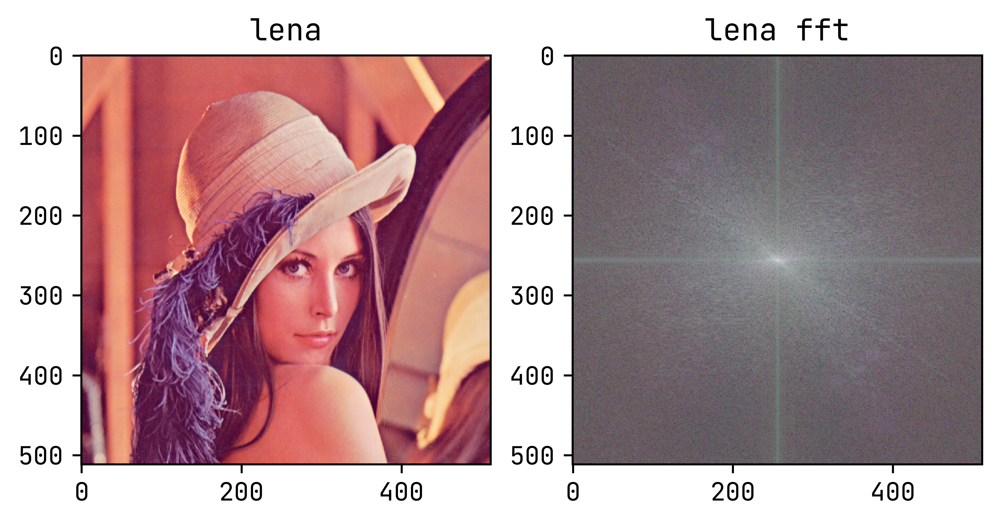

In [ ]:
# 对原图进行傅里叶变换

img_fft = np.transpose([fft.fft2(img_rgb[:, :, i]) for i in range(3)], (1, 2, 0)) # 3通道分别进行傅里叶变换, 并转置为 (h, w, 3) 的形式
img_fft_shift = fft.fftshift(img_fft)

# 显示结果
show_images([img_rgb, center_log_spectrum(img_fft_shift)], ['lena', 'lena fft'], 1, 2)

### 频域添加水印

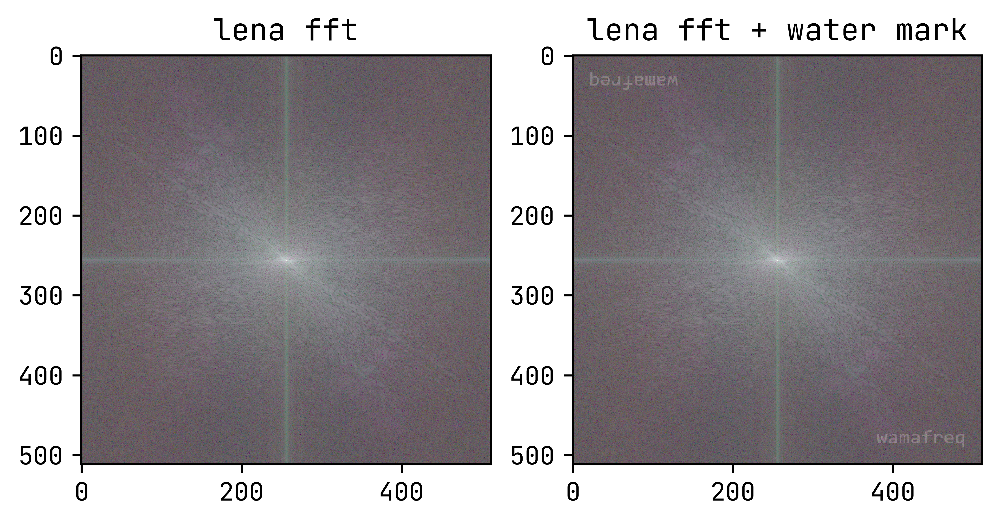

In [ ]:
# 对频域叠加水印 water_mark

img_fft_shift_wm = img_fft_shift * ( 1 + WATER_MARK_ALPHA*(water_mark[:, :, :1]) ) # 只取一个通道

# 显示
show_images([center_log_spectrum(img_fft_shift), center_log_spectrum(img_fft_shift_wm)], ['lena fft', 'lena fft + water mark'], 1, 2)

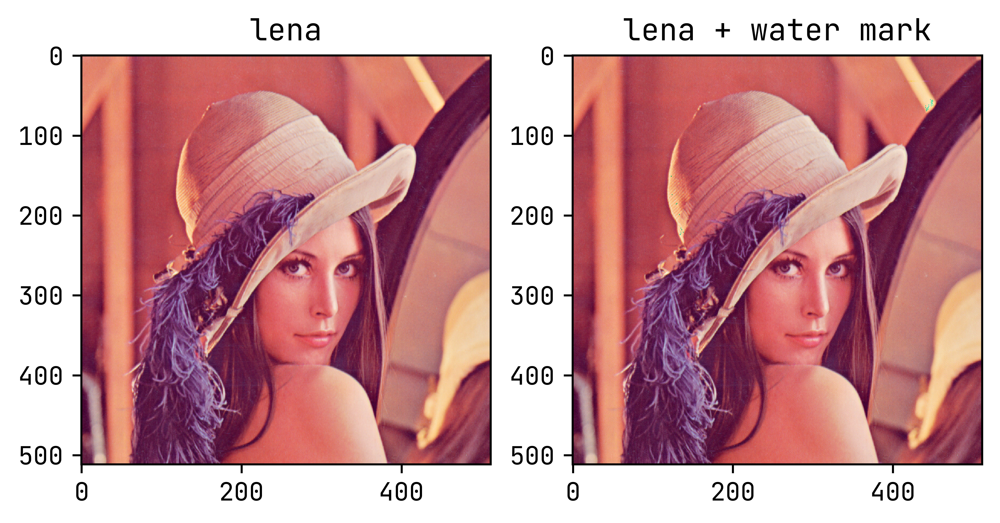

In [ ]:
# 逆变换
# img_ifft = np.uint8(np.transpose([fft.ifft2(fft.ifftshift(img_fft_shift_wm[:, :, i])) for i in range(3)], (1, 2, 0)).real)
img_ifft = np.uint8(np.transpose([fft.ifft2(fft.ifftshift(img_fft_shift_wm[:, :, i])) for i in (1 ,2, 0)], (1, 2, 0)).real)
# rgb <- gbr

# 对比显示 原图 和 水印图
show_images([img_rgb, img_ifft], ['lena', 'lena + water mark'], 1, 2)


### 对比差异

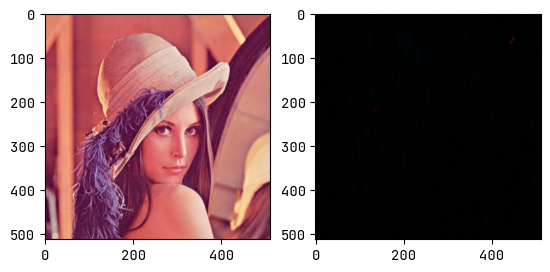

In [ ]:
# 对比差异
show_images([img_rgb , np.uint8(np.abs(np.int16(img_rgb) - np.int16(img_ifft)))], ['lena', 'lena - (lena + water mark)'], 1, 2)

## 验证

In [ ]:
# 对 img_ifft 进行深拷贝
img_wm = img_ifft.copy()

### 对水印图像进行裁剪

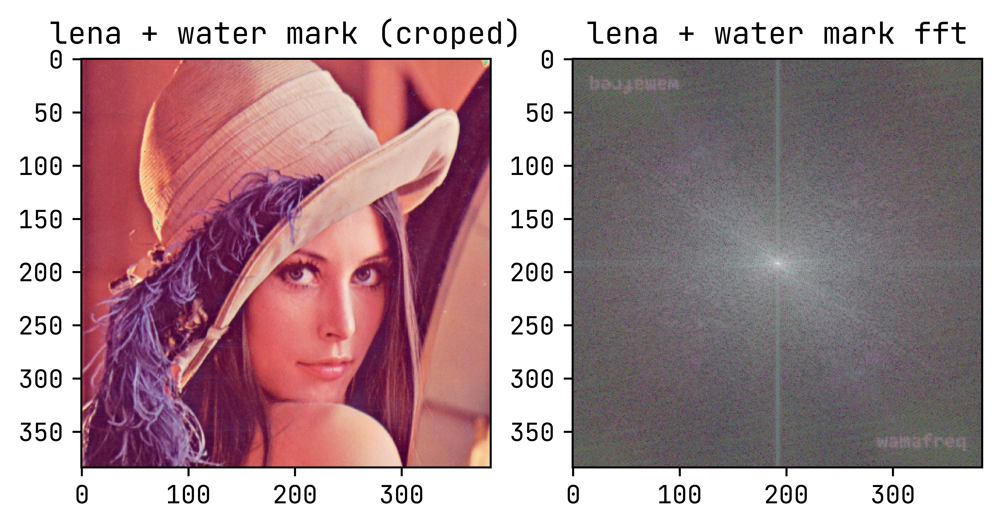

In [ ]:
# 裁剪 img_wm 四边各64像素
img_wm1 = img_wm[64:-64, 64:-64]

# fft
img_wm1_fft = np.transpose([fft.fft2(img_wm1[:, :, i]) for i in range(3)], (1, 2, 0))

# 显示裁剪图像及其频谱
show_images([img_wm1, center_log_spectrum(fft.fftshift(img_wm1_fft))], ['lena + water mark (croped)', 'lena + water mark fft'], 1, 2)

### 对水印图像进行旋转

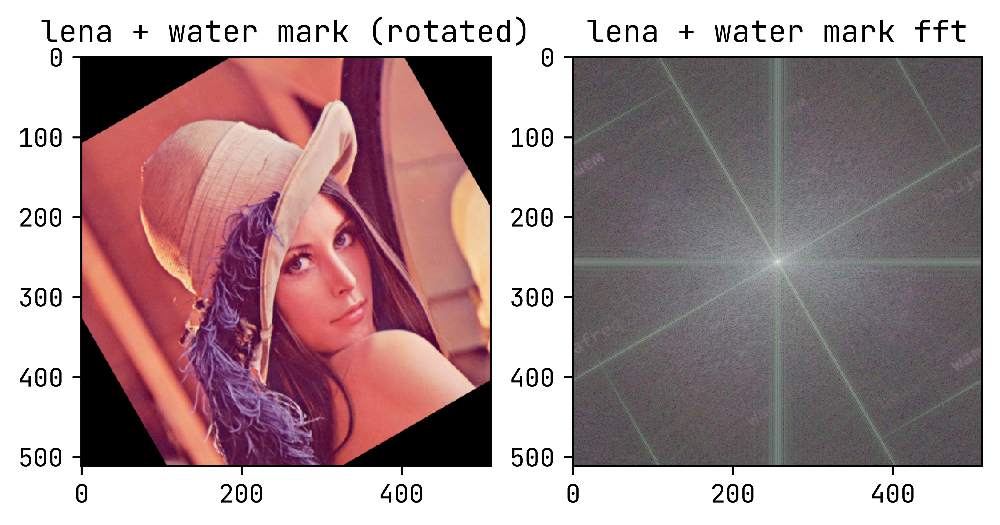

In [ ]:
# 通过 opencv 将 img_wm 顺时针旋转30度
img_wm2 = cv2.warpAffine(img_wm, cv2.getRotationMatrix2D((img_wm.shape[1] // 2, img_wm.shape[0] // 2), 30, 1), (img_wm.shape[1], img_wm.shape[0]))

# fft
img_wm2_fft = np.transpose([fft.fft2(img_wm2[:, :, i]) for i in range(3)], (1, 2, 0))

# 显示裁剪图像及其频谱
show_images([img_wm2, center_log_spectrum(fft.fftshift(img_wm2_fft))], ['lena + water mark (rotated)', 'lena + water mark fft'], 1, 2)

### 对水印图像进行涂抹

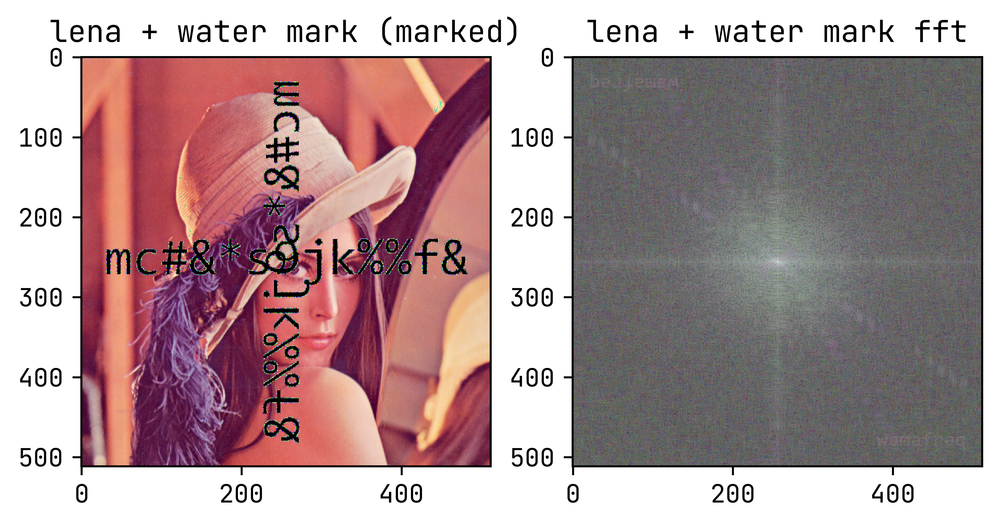

In [ ]:
# 在水印图像 img_wm 的中间位置插入水印
img_wm3 = img_wm.copy()
new_mark = load_water_mark('text', 'mc#&*s9jk%%f&', 64)
x1 = img_wm.shape[0] // 2 - new_mark.shape[0] // 2
x2 = x1 + new_mark.shape[0]
y1 = img_wm.shape[1] // 2 - new_mark.shape[1] // 2
y2 = y1 + new_mark.shape[1]
img_wm3[x1:x2, y1:y2] = np.uint64(img_wm3[x1:x2, y1:y2]) * (1 + np.uint64(new_mark))
img_wm3[y1:y2, x1:x2] = np.uint64(img_wm3[y1:y2, x1:x2]) * (1 + np.transpose(np.uint64(new_mark),(1,0,2)))

# 裁剪至255范围内
img_wm3[img_wm3 > 255] = 255
img_wm3[img_wm3 < 0] = 0
img_wm3 = np.uint8(img_wm3)

# fft
img_wm3_fft = np.transpose([fft.fft2(img_wm3[:, :, i]) for i in range(3)], (1, 2, 0))

# 显示裁剪图像及其频谱
show_images([img_wm3, center_log_spectrum(fft.fftshift(img_wm3_fft))], ['lena + water mark (marked)', 'lena + water mark fft'], 1, 2)